In [1]:
import sys
import os
# Add the directory containing 'thesis_utils.py' to the system path
sys.path.append(os.path.abspath('..'))  # If 'thesis_utils.py' is one level up
# Or use this if it's in the same directory as the notebook:
# sys.path.append(os.getcwd())
# os.environ["JULIA_NUM_THREADS"] = "8" 
os.environ["PYTHON_JULIACALL_HANDLE_SIGNALS"] = "yes"
os.environ["PYTHON_JULIACALL_THREADS"] = "auto"
os.environ["PYTHON_JULIACALL_OPTLEVEL"] = "3"
from pysr import PySRRegressor
import pandas as pd
import numpy as np
from ydata_profiling import ProfileReport
from sdmetrics.single_column import KSComplement

from thesis_utils import *

Detected IPython. Loading juliacall extension. See https://juliapy.github.io/PythonCall.jl/stable/compat/#IPython


In [57]:
import importlib
import thesis_utils  # or whatever your module is called

importlib.reload(thesis_utils)

from thesis_utils import *

In [2]:
data = pd.read_csv("../../data/air_quality/air_quality_cleaned.csv")
# sub sampling due to degrading performance with too large datasets in denoising and SR
# data_sample = data.sample(n=9600, random_state=42)

In [3]:
# Generate the profiling report
profile_full = ProfileReport(data, title="Air", explorative=True)

# Display the report in the notebook
profile_full.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 14/14 [00:00<00:00, 2275.27it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [3]:
# variable assignment according to correlation structure
independents_lst = ['AH', 'PT08.S4(NO2)', 'RH']
dependent_var = 'T'
X = data[independents_lst].to_numpy()
y = data[dependent_var].to_numpy()

In [24]:
sr_model = PySRRegressor(
        niterations=1024,  # Number of iterations to search for equations
        binary_operators=["+", "-", "*", "/"],
        unary_operators=["log", "abs", "sqrt"],
        maxdepth=10,
        elementwise_loss="loss(x, y) = (x - y)^2",  # Define loss function (mean squared error)
        verbosity=0,
        maxsize=50
    )
sr_model.fit(X, y)

PySRRegressor.equations_ = [
	    pick         score                                           equation  \
	0         0.000000e+00                                          17.755339   
	1         2.684825e-01                                     x0 * 17.525528   
	2         7.811535e-01                               x0 * (728.7407 / x2)   
	3         7.243212e-01                1012.1083 / ((x2 / x0) + 10.123601)   
	4         1.649124e+00   (2437.271 / ((x2 / x0) + 34.790993)) - 11.190738   
	5         3.601789e-03  (2449.196 / (((x2 - 0.17826234) / x0) + 35.087...   
	6         8.290742e-02  (2553.9363 / (((-22.527933 / x2) + (x2 / x0)) ...   
	7         8.757817e-01  ((x0 * 1443.4854) / ((x0 * 22.114296) + x2)) +...   
	8         4.270706e-01  (((x0 * 1175.5012) / ((x0 * 17.856928) + x2)) ...   
	9         1.129701e-02  (((x0 / (x2 + (x0 * 17.841547))) + 0.003088219...   
	10        1.602375e-02  (((x0 / ((x0 * 18.061705) + x2)) * 1183.2622) ...   
	11  >>>>  6.796863e-01  (((x0 / ((x0 * 9.057289) + x2)) * 582.24036) +...   
	12        2.703901e-03  ((((x0 / ((x0 * 8.309219) + x2)) * 264.76126) ...   
	13        1.351105e-02  (((((x0 / ((x0 * 8.340417) + x2)) * 264.75986)...   
	14        8.237534e-05  (((((x0 / (x2 + (x0 * 8.340368))) + 2.83464e-5...   
	15        1.224371e-04  (((((x0 / (x2 + (x0 * 8.35405))) * 264.7591) +...   
	16        5.510091e-04  (((((x0 / ((x0 * 8.354057) + x2)) * 264.7591) ...   
	17        2.058213e-07  (((2.0200617 * ((264.7591 * (x0 / ((x0 * 8.354...   
	18        5.120499e-04  (((11.699391 + (x0 * (264.7591 / (x2 + (x0 * 8...   
	19        2.724330e-03  (((((x0 * 264.75912) / (x2 + (8.353759 * x0)))...   
	20        2.817744e-03  ((((x0 * (264.75912 / ((x0 * 8.353759) + x2)))...   
	21        1.760909e-03  ((((264.7591 / (x2 + (x0 * 8.354049))) * x0) +...   
	22        1.426767e-03  ((((x0 * 264.75912) / ((x0 * 8.353759) + x2)) ...   
	23        1.313731e-03  (((((264.7591 / (x2 + (8.354007 * x0))) * x0) ...   
	24        2.874686e-03  (((((x0 * 264.75912) / ((x0 * 8.353759) + x2))...   
	25        1.285160e-03  ((11.699597 + (x0 * (264.7591 / (x2 + (x0 * 8....   
	26        7.145199e-04  (-1.632928 + ((2.022471 * (((264.7591 / (x2 + ...   
	27        1.264951e-03  ((-1.632928 + (((x0 * (264.7591 / (x2 + (8.353...   
	28        1.049354e-03  ((((((x0 / (x2 + (x0 * 8.353927))) * 264.7591)...   
	
	         loss  complexity  
	0   78.221130           1  
	1   45.721780           3  
	2    9.585655           5  
	3    2.251565           7  
	4    0.083190           9  
	5    0.082593          11  
	6    0.069973          13  
	7    0.012141          15  
	8    0.005168          17  
	9    0.005052          19  
	10   0.004893          21  
	11   0.001257          23  
	12   0.001250          25  
	13   0.001216          27  
	14   0.001216          29  
	15   0.001216          31  
	16   0.001215          33  
	17   0.001215          35  
	18   0.001214          36  
	19   0.001211          37  
	20   0.001207          38  
	21   0.001205          39  
	22   0.001203          40  
	23   0.001202          41  
	24   0.001198          42  
	25   0.001197          43  
	26   0.001195          45  
	27   0.001192          47  
	28   0.001190          49  
]

In [4]:
# 20250430_173557_uBKd2K
# Complexity 9
candidate_function = generate_candidate_function("(2437.271 / ((x2 / x0) + 34.790993)) - 11.190738")
# candidate_function = generate_candidate_function("0.5136726*x2 + 1.2973638799338*sqrt(x4) + 0.5136726*sqrt(Abs(x1)) + 0.5136726*Abs(x3 + log(x5)*sin(2.48172932259734*sin(log(x5) - 0.88440996)))")

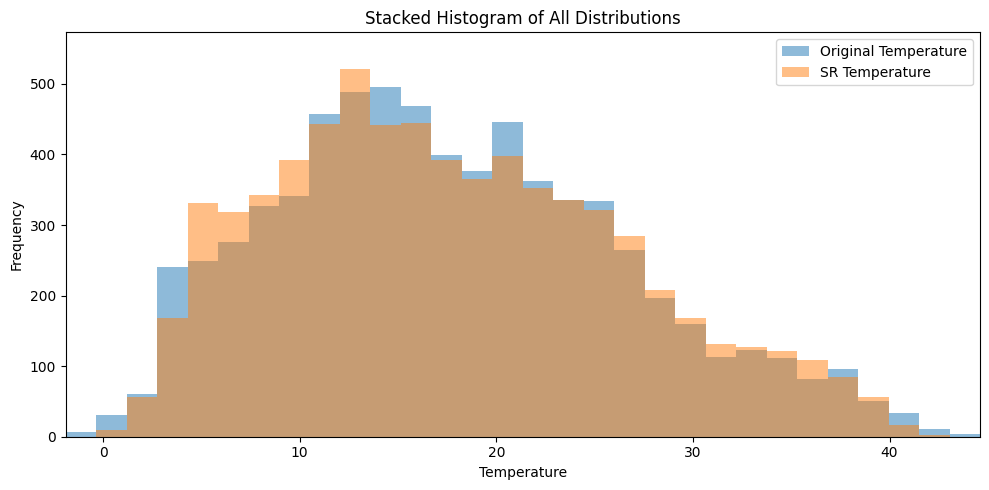

In [5]:
%matplotlib inline
X_aux = X[:, [0, 2]]
y_sr = candidate_function(X_aux)
# y_denoised = candidate_function(X)
plot_histograms([(y, 'Original Temperature', None), (y_sr, 'SR Temperature', None)], 'Temperature', stack=True, figsize_per_plot=(10, 5))

In [6]:
kscomplement_score = KSComplement.compute(
    real_data=y,
    synthetic_data=y_sr
)
print(f'KSComplement Score = {round(kscomplement_score * 100, 2)}%')

KSComplement Score = 98.3%


<Figure size 640x480 with 0 Axes>

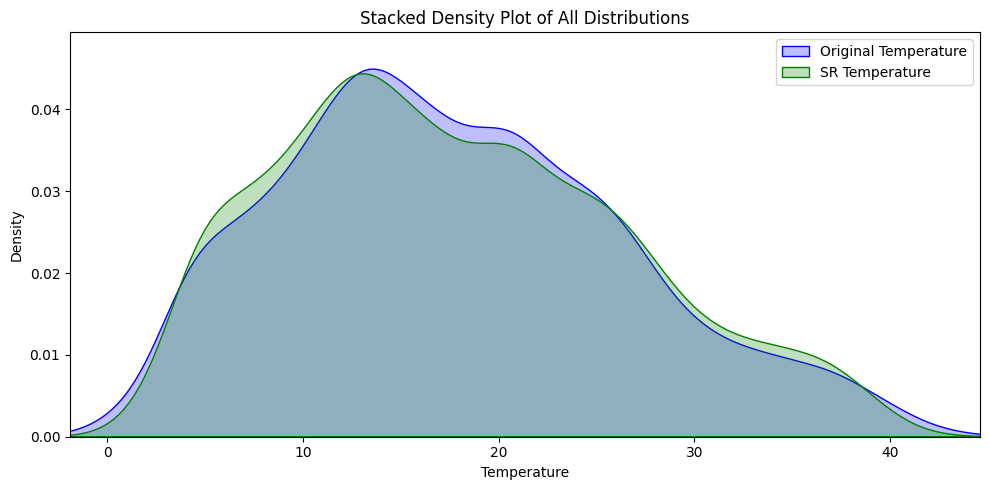

In [7]:
plot_densities([(y, 'Original Temperature', 'blue'), (y_sr, 'SR Temperature', 'green')], 'Temperature', stack=True, figsize_per_plot=(10, 5))

In [8]:
orig_residuals = y - y_sr

In [9]:
y_corrected, best_amp, errors, _ = correct_predictions(y, y_sr, method='stratified', seed=42, clip_lower=0, clip_upper=None, original_residuals=None, tail_replace=True, lower_percentile=50)
# ignore error in orig_residuals after first run

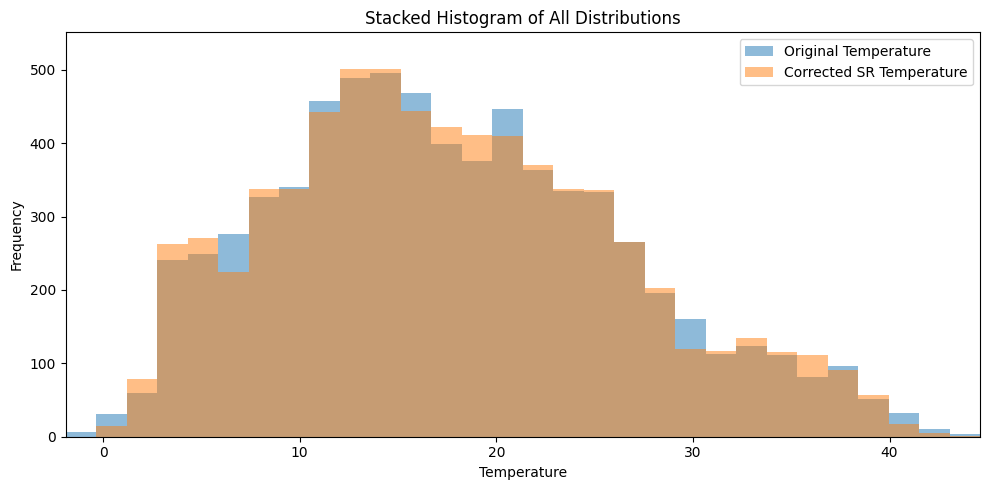

In [10]:
plot_histograms([(y, 'Original Temperature', None), (y_corrected, 'Corrected SR Temperature', None)], 'Temperature', stack=True, figsize_per_plot=(10, 5))

In [11]:
kscomplement_score = KSComplement.compute(
    real_data=y,
    synthetic_data=y_corrected
)
print(f'KSComplement Score = {round(kscomplement_score * 100, 2)}%')

KSComplement Score = 99.09%


<Figure size 640x480 with 0 Axes>

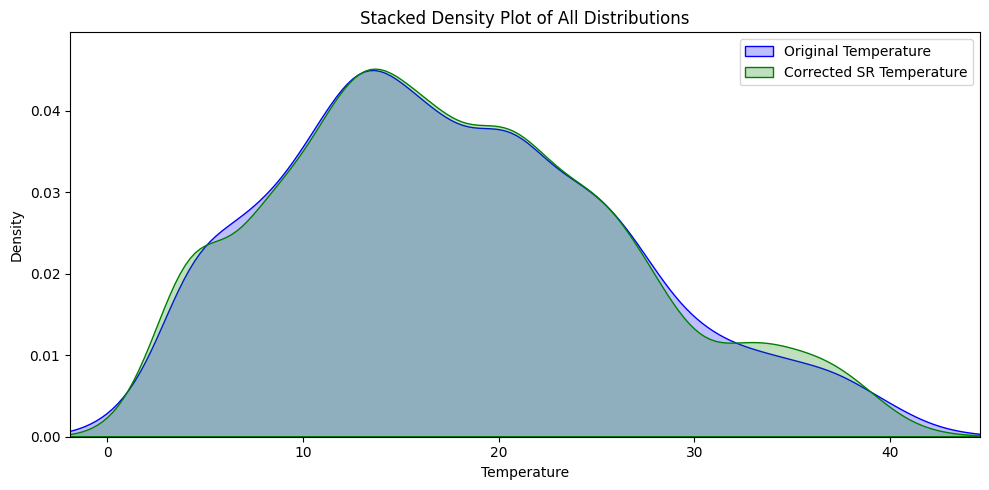

In [12]:
plot_densities([(y, 'Original Temperature', 'blue'), (y_corrected, 'Corrected SR Temperature', 'green')], 'Temperature', stack=True, figsize_per_plot=(10, 5))

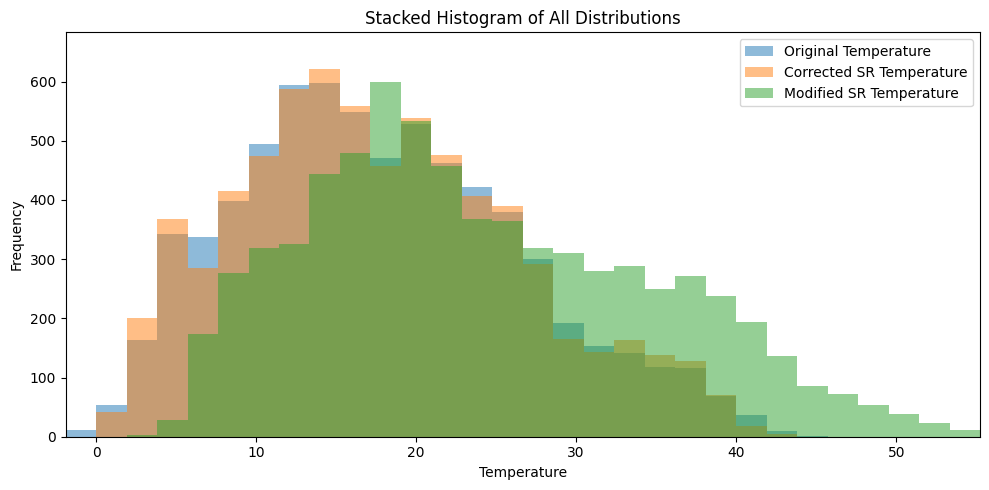

In [18]:
mod_candidate_function = generate_candidate_function("(2437.271 / ((x2 / 1.2*x0) + 34.790993)) - 11.190738")
mod_y_sr = mod_candidate_function(X_aux)
mod_y_corrected, best_amp, errors, _ = correct_predictions(y, mod_y_sr, method='stratified', amplification_factor=1.0, seed=42, clip_lower=0, clip_upper=None, original_residuals=orig_residuals, tail_replace=True, lower_percentile=50)
# ignore error in orig_residuals after first run
plot_histograms([(y, 'Original Temperature', None), (y_corrected, 'Corrected SR Temperature', None), (mod_y_corrected, 'Modified SR Temperature', None)], 'Temperature', stack=True, figsize_per_plot=(10, 5))